In [1]:
from tools import analytics

**What To Look At**
- Highlight commonalities
- Limitations
- Intereseting samples (both images and labels)

### Load, process and vizualize training samples and labels

In [2]:
CFG_PATH = "core/configs/task21/tdt4265.py"
SET_TYPE = "val"
BATCH_SIZE = 1 

cfg_file = analytics.get_config(CFG_PATH)
cfg, dataset, gpu_tfms = analytics.prepare_dataset(cfg_file, dataset_type=SET_TYPE, batch_size=BATCH_SIZE)
img_mean, img_std = analytics.calculate_mean_std(cfg)

print(f"Using transforms: ")
[print(f["_target_"]) for f in cfg.data_train.dataset.transform.transforms]

Using transforms: 
<class 'core.transforms.transform.ToTensor'>
<class 'core.transforms.transform.Resize'>
<class 'core.transforms.target_transform.GroundTruthBoxesToAnchors'>


[None, None, None]

In [3]:
cfg_file = analytics.get_config(CFG_PATH)
cfg, _, _ = analytics.prepare_dataset(cfg_file, dataset_type=SET_TYPE, batch_size=BATCH_SIZE)
metadata = analytics.load_annotation_file(cfg, SET_TYPE)
annotations = analytics.process_annotations(metadata["annotations"])

In [4]:
metadata = analytics.load_annotation_file(cfg, SET_TYPE)
annotations = analytics.process_annotations(metadata["annotations"])
catagories = analytics.process_categories(metadata["categories"])

In [5]:
# Replace category_id with category_name from catagories
annotations["category_id"] = annotations["category_id"].map(catagories.set_index("id")["name"])

In [6]:
annotations.head()

,id,image_id,category_id,area,xmin,ymin,xmax,ymax,width,height
0,1,1,car,44.4994,1020.42,65.40,1024.00,77.83,3.58,12.43
1,2,1,person,34.3440,983.18,58.35,985.83,71.31,2.65,12.96
2,3,1,car,267.4260,534.86,68.97,552.76,83.91,17.90,14.94
3,4,1,rider,34.9680,471.78,69.62,476.43,77.14,4.65,7.52
4,5,1,rider,77.8083,469.35,69.90,475.54,82.47,6.19,12.57


In [7]:
unique_catagories = annotations["category_id"].unique().tolist()

metrics_frame = analytics.get_category_metrics(annotations["category_id"], decimals=2)
metrics_frame

,category,total,in %
0,person,3699,66.72
1,car,1437,25.92
2,rider,315,5.68
3,bus,93,1.68


### Statistics of Bounding Boxes

In [8]:
avg_bbox_stats = annotations.drop(columns=["id", "image_id", "category_id"])
analytics.remove_outliers(avg_bbox_stats).describe().round(3)

,area,xmin,ymin,xmax,ymax,width,height
count,5544.000,5544.000,5544.000,5544.000,5544.000,5544.000,5544.000
mean,554.109,434.966,70.798,449.855,105.358,14.499,34.438
std,667.206,258.102,8.285,257.671,19.178,15.291,18.582
min,33.150,0.594,46.530,14.490,70.843,2.650,7.520
25%,145.988,242.630,66.298,260.530,86.820,6.710,17.015
50%,341.618,418.410,71.125,434.130,106.995,10.245,33.195
75%,589.128,581.105,75.802,592.222,125.800,15.360,48.660
max,3632.268,1006.368,90.676,1012.597,128.000,99.156,79.521


### Statistics of Car Bounding Boxes

In [9]:
car_annotations = annotations[annotations["category_id"] == "car"]
car_bbox_stats = car_annotations.drop(columns=["id", "image_id", "category_id"])
analytics.remove_outliers(car_bbox_stats).describe().round(3)

,area,xmin,ymin,xmax,ymax,width,height
count,1437.000,1437.000,1437.000,1437.000,1437.000,1437.000,1437.000
mean,727.028,375.496,74.107,400.431,96.208,24.845,22.007
std,891.350,271.587,8.065,271.441,18.309,20.644,12.215
min,34.941,0.000,58.545,8.010,65.878,4.613,6.511
25%,149.880,110.300,69.020,155.240,82.580,12.760,12.450
50%,319.059,409.080,72.900,434.390,91.060,16.640,18.510
75%,883.160,503.720,79.750,527.400,107.660,28.850,28.700
max,3586.668,1016.015,102.691,1022.477,128.000,103.301,48.498


### Statistics of Bus Bounding Boxes

In [10]:
bus_annotations = annotations[annotations["category_id"] == "bus"]
bus_annotations = bus_annotations.drop(columns=["id", "image_id", "category_id"])
analytics.remove_outliers(bus_annotations).describe().round(3)

,area,xmin,ymin,xmax,ymax,width,height
count,93.000,93.000,93.000,93.000,93.000,93.000,93.000
mean,5356.143,330.638,55.292,415.471,104.439,84.709,49.135
std,5158.652,131.441,7.579,106.293,13.815,58.717,21.012
min,254.898,56.999,42.842,99.861,85.537,14.358,17.745
25%,928.345,249.140,48.670,426.500,90.500,31.480,29.490
50%,3333.441,381.960,55.660,464.850,103.700,68.350,47.500
75%,8574.258,440.480,62.530,472.400,116.160,123.660,68.500
max,16411.443,472.712,67.792,487.069,128.000,209.270,83.665


### Statistics of Average Bounding Boxes 

In [11]:
avg_bbox_stats = analytics.get_avg_box_metrics(annotations, unique_catagories=unique_catagories); avg_bbox_stats

,type,car,person,rider,bus
0,area,548.08,403.1,85.67,4165.11
1,aspect,12:11,9:40,1:2,12:7
2,width,24.89,9.88,6.74,84.76
3,height,22.02,40.8,12.71,49.14


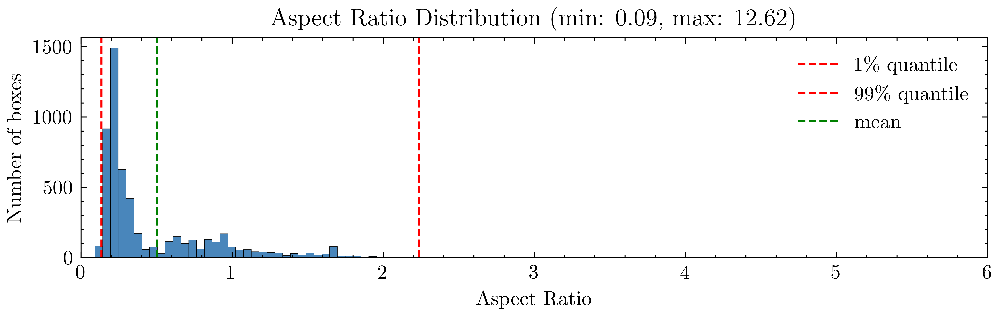

In [12]:
analytics.view_aspect_ratio_distribution(annotations)

In [13]:
avg_bbox_stats.describe()

,type,car,person,rider,bus
count,4,4.00,4.0,4.00,4.00
unique,4,4.00,4.0,4.00,4.00
top,area,548.08,403.1,85.67,4165.11
freq,1,1.00,1.0,1.00,1.00


In [14]:
blob = avg_bbox_stats.describe().style.to_latex()
print(blob)

\begin{tabular}{llrrrr}
 & type & car & person & rider & bus \\
count & 4 & 4.000000 & 4.000000 & 4.000000 & 4.000000 \\
unique & 4 & 4.000000 & 4.000000 & 4.000000 & 4.000000 \\
top & area & 548.080000 & 403.100000 & 85.670000 & 4165.110000 \\
freq & 1 & 1.000000 & 1.000000 & 1.000000 & 1.000000 \\
\end{tabular}



### STATISTICAL Observations based on initial intuition

**Catagories**
- We can see that we have quite skewed distribution of catagories.
- There are considerly more cars ($9563$ in this set) then anything else, above $50 \%$ of the total dataset.
- Looking at the CAR boxes, we can see that the average width and height in pixels of the bounding boxes are are $28.405$ and $26.056$ respectively.   
  This would then indicate that if an image is $1024 x 128$ in width and heigth, then the relative box width and height would be $2.8 \%$ and $20.4 \%$. (??).   
  This indicates that we're looking at a relatively small bounding boxes in spesific areas of the image and not soo much big objects.   
  (See following sections for actual visualizations).


**Boxes**
- Give that we mostly have cars (above $50 \%$), then we could expect best performance on boxes with close to quadratic or rectangular shapes with some what even distribution of aspect ratios.
- Similary for persons, which have a entierly different shape of boxes compared to cars. Here we're facing tall and slim rectangular boxes.
- On the other hand of the scale, the largets feasible rectangular shapes are poorly represented in the dataset and could (?) naturally therefore be thought of as harder objects to detect.
- The same could be said for busses, as these two (respepectfully at $0.67 \%$ and $2.43 \%$ of the dataset) are close to represetning only $3 \%$ of the dataset.
- Comparing the dimentions of the different bounding boxes for each catagory, we can see that we all classes have different area size. We can also note similar size features for person, rider, bicycle and scooter as these in real-life are objects with intersecting each-other (e.g *a person can be riding a bicycle => rider*, *a person could be on a scooter => rider* etc..) 
- Taking catagory frequency and aspect ratio dimentions info consideration,
  we can see a quite varying distribution. This further indicates that the dataset is not very homogeneous.
  The average aspect ratios shows that:
    - aspect ratios &#8773; 1 indicates similarities to square shapes (cars, busses, trucks)
    - aspect ratios &#60; 1 indicates similarities to tall and narrow shapes (persons, riders, bicycles, scooters)
    - aspect ratios &#62; 1 indicates similarities to wide and short shapes (non-observered)

In [15]:
from tqdm import tqdm 

for sample in tqdm(iter(dataset)):
    image, boxes = analytics.preprocess_sample(
        sample,
        gpu_tfms,
        img_std,
        img_mean
    )
    analytics.save_sample(
        img_id = sample["image_id"][0],
        image = image,
        boxes = boxes,
        labels = sample["labels"][0].cpu().numpy().tolist(),
        lblmap = cfg.label_map,
        save_dir = os.path.join("inspect", SET_TYPE)
    )

100%|██████████| 301/301 [00:24<00:00, 12.44it/s]


### VISUAL Observation based on initial intuition

- Images are of dimention $1024 x 128$, thereby quite wide with an aspect ratio of 
- Noted a case where the annotation box of a person is overlapping a car (?)
- The shape of the bounding boxes varies greatly, as we've noted in the statisical observations. The following shapes have been observed:
    - Most of the bounding boxes are rectangular.
    - Some of the bounding boxes are quite tall, but short in width.
    - Some of the bounding boxes are almost square, but not quite.
    - The sizes varies greatly, and can be everything from a few pixels to a few hundred pixels.    
      (e.g. could have a picture with a huge bounding box of a bus and a tiny slim box of a person or a bicyle for that matter.)
- Based on previous stastistics of the bounding boxes metrics, we can confirm what we observered about the dataset.
- We can for instance see that the aspect ratio of the car boxes are quite close to 1, and the above 1 for persons which have taller but narrow boxes. 
- Certain boxes are occluded behind other objects, which makes it hard to see. 

#### Remarks
- Running the analysis for both training and validation set shows that the dataset is quite skewed in terms of the number of bounding boxes per catagory.
- The training set has all catagories cars, persons, rider, bicycle, scooter, bus and truck (in decsending order). 
- The validation set has only the catagories persons, car, rider and bus (in descending order).

## VISUAL Observations by looking through all images (finding weird annotations)

**TRAINING SET**    
(img_id, cause of weirdness)
- 10, person is behind three
- 50-97, car is annotated through the car
- 121, empty car annotation
- 138-151, a lot of scooter annotations missing?
- 303-403, missing a lot of bicycles?
- 428-440, missing a lot of bicycles?
- 636-684, missing a lot of bicycles?
- 763-768, rider+bicycle is behind passing big black car?
- 801-804, rider+bicycle+person are behind threes?
- 824-830, car to the right is occluded by object
- 905-910, car in right lane is occluded by another car
- 994-999, person/rider (missing bicycle) is behind car in right lane
- 1008-1018, car is occluded by another by big truck
- 1122-1124, person on sidewalk is occluded by a passing car
- 1205-1242, on right side, walking person, rider and car is kind of occluded with eachother
- 1223-1228, rider on left side is occluded by passing car
- 1243-1272, walking person on right side is partially occluded by car
- 1275-1293, walking person on right side is partially occluded by car
- 1308-1311, cars in line on left side occluded big big car behind
- 1343-1353, walking persons on sidewalk occluded by passing cars
- 1384-1399, walking persons on sidewalk occluded by passing cars

**VALIDATION SET**    
(img_id, cause of weirdness)
- 13-18, right side, person on sidewalk occluded by passing car
- 48-71, isnt bicycle also to be annotated whe annotating a rider?
- 89-91, left side, person on sidewalk occluded by passing car
- 72-101, are persons in mirrors also persons?
- 102-107, left side, car/persons occluded by passing bus
- 114, left side, car/persons occluded by passing bus
- 118-126
    - persons occluded by passing car
    - persons occluded by passing bus
    - parked cars occluded by passing car
    - bus occluded by anoter bus passing bus
- 129-131, left side, persons on sidewalk occluded by passing car
- 151-153, left side, persons on sidewalk occluded by passing car
- 159-162, left center, persons on sidewalk occluded by passing car
- 171-175, left center, persons on sidewalk occluded by passing car
- 180-182, center, persons on sidewalk occluded by passing car
- 187-189, left side, persons on sidewalk occluded by passing car
- 181-189, parked bus occluded by passing bus
- 202-244, left side: parked scooters missing annotations
- 226-257, right side: parked bicycles / scooters missing annotations
- 213-263, both sides: standing people with occational occlusions
- 290-301, center: parked scooters missing annotations

## Keeps In Mind:

- Object detection is customarily considered to be much harder than image classification, particularly because of these five challenges:
    - dual priorities
    - speed
    - multiple scales
    - limited data
    - class imbalance

## Clustering BBoxes

In [6]:
from tools import analytics

CFG_PATH = "neuralvision/configs/task22/baseline_aug1234.py"
SET_TYPE = "train"
BATCH_SIZE = 1

cfg_file = analytics.get_config(CFG_PATH)
cfg, _, _ = analytics.prepare_dataset(cfg_file, dataset_type=SET_TYPE, batch_size=BATCH_SIZE)
metadata = analytics.load_annotation_file(cfg, SET_TYPE)
annotations = analytics.process_annotations(metadata["annotations"])

In [7]:
annotations.head()

,id,image_id,category_id,area,xmin,ymin,xmax,ymax,width,height
0,1,1,1,280.2960,725.93,63.64,746.33,77.38,20.40,13.74
1,2,1,7,248.6808,351.26,81.08,359.20,112.40,7.94,31.32
2,3,1,6,171.6447,187.57,81.25,194.84,104.86,7.27,23.61
3,4,1,6,144.4352,431.30,87.54,438.58,107.38,7.28,19.84
4,5,1,1,1454.7000,107.80,78.10,145.10,117.10,37.30,39.00


In [43]:
import numpy as np
from matplotlib import pyplot as plt


def iou(box, clusters):
    """
    Calculates the Intersection over Union (IoU) between a box and k clusters.
    :param box: tuple or array, shifted to the origin (i. e. width and height)
    :param clusters: numpy array of shape (k, 2) where k is the number of clusters
    :return: numpy array of shape (k, 0) where k is the number of clusters
    """
    x = np.minimum(clusters[:, 0], box[0])
    y = np.minimum(clusters[:, 1], box[1])
    if np.count_nonzero(x == 0) > 0 or np.count_nonzero(y == 0) > 0:
        raise ValueError("Box has no area")

    intersection = x * y
    box_area = box[0] * box[1]
    cluster_area = clusters[:, 0] * clusters[:, 1]

    iou_ = intersection / (box_area + cluster_area - intersection)

    return iou_


def avg_iou(boxes, clusters):
    """
    Calculates the average Intersection over Union (IoU) between a numpy array of boxes and k clusters.
    :param boxes: numpy array of shape (r, 2), where r is the number of rows
    :param clusters: numpy array of shape (k, 2) where k is the number of clusters
    :return: average IoU as a single float
    """
    return np.mean([np.max(iou(boxes[i], clusters)) for i in range(boxes.shape[0])])


def translate_boxes(boxes):
    """
    Translates all the boxes to the origin.
    :param boxes: numpy array of shape (r, 4)
    :return: numpy array of shape (r, 2)
    """
    new_boxes = boxes.copy()
    for row in range(new_boxes.shape[0]):
        new_boxes[row][2] = np.abs(new_boxes[row][2] - new_boxes[row][0])
        new_boxes[row][3] = np.abs(new_boxes[row][3] - new_boxes[row][1])
    return np.delete(new_boxes, [0, 1], axis=1)



def show_cluster(data, cluster, max_points=2000):
    """
    Display bouding box's size distribution and anchor generated in scatter.
    """
    plt.figure(figsize=(8, 2), dpi=1200)
    if len(data) > max_points:
        idx = np.random.choice(len(data), max_points)
        data = data[idx]
    plt.scatter(data[:,0], data[:,1], s=5, c='lavender')
    plt.scatter(cluster[:,0], cluster[:, 1], c='red', s=100, marker="^")
    plt.xlabel("Width")
    plt.ylabel("Height")
    plt.title("Bounding and anchor distribution")
    plt.show()

def show_width_height(data, cluster, bins=50):
	'''
	Display bouding box distribution with histgram.
	'''
	if data.dtype != np.float32:
		data = data.astype(np.float32)
	width = data[:, 0]
	height = data[:, 1]
	ratio = height / width

	plt.figure(1,figsize=(20, 6))
	plt.subplot(131)
	plt.hist(width, bins=bins, color='green')
	plt.xlabel('width')
	plt.ylabel('number')
	plt.title('Distribution of Width')

	plt.subplot(132)
	plt.hist(height,bins=bins, color='blue')
	plt.xlabel('Height')
	plt.ylabel('Number')
	plt.title('Distribution of Height')

	plt.subplot(133)
	plt.hist(ratio, bins=bins,  color='magenta')
	plt.xlabel('Height / Width')
	plt.ylabel('number')
	plt.title('Distribution of aspect ratio(Height / Width)')
	plt.savefig("shape-distribution.png")
	plt.show()
	

def sort_cluster(cluster):
	'''
	Sort the cluster to with area small to big.
	'''
	if cluster.dtype != np.float32:
		cluster = cluster.astype(np.float32)
	area = cluster[:, 0] * cluster[:, 1]
	cluster = cluster[area.argsort()]
	ratio = cluster[:,1:2] / cluster[:, 0:1]
	return np.concatenate([cluster, ratio], axis=-1)
    
def kmeans(boxes, k, dist=np.median):
    """
    Calculates k-means clustering with the Intersection over Union (IoU) metric.
    :param boxes: numpy array of shape (r, 2), where r is the number of rows
    :param k: number of clusters
    :param dist: distance function
    :return: numpy array of shape (k, 2)
    """
    rows = boxes.shape[0]

    distances = np.empty((rows, k))
    last_clusters = np.zeros((rows,))

    np.random.seed()

    # the Forgy method will fail if the whole array contains the same rows
    clusters = boxes[np.random.choice(rows, k, replace=False)]

    while True:
        for row in range(rows):
            distances[row] = 1 - iou(boxes[row], clusters)

        nearest_clusters = np.argmin(distances, axis=1)

        if (last_clusters == nearest_clusters).all():
            break

        for cluster in range(k):
            clusters[cluster] = dist(boxes[nearest_clusters == cluster], axis=0)

        last_clusters = nearest_clusters

    return clusters

scaled_resolutions = []

IMG_W = 1024
IMG_H = 128

for row in annotations.itertuples():
    width = row.width / IMG_W
    height = row.height / IMG_H
    scaled_resolutions.append([width, height])

wh = np.array(scaled_resolutions)
print(F"Clustering = (N object, width and height) =  {wh.shape}")

Clustering = (N object, width and height) =  (18287, 2)


In [113]:
CLUSTERS = 6

out = kmeans(wh, k=CLUSTERS, iter=60)

TypeError: kmeans() got an unexpected keyword argument 'iter'

In [44]:
print("Accuracy: {:.2f}%".format(avg_iou(wh, out) * 100))
print("Boxes:\n {}".format(out))

ratios = np.around(out[:, 0] / out[:, 1], decimals=2).tolist()
print("Ratios:\n {}".format(sorted(ratios)))

Accuracy: 67.18%
Boxes:
 [[0.0130957  0.10492188]
 [0.0044043  0.09640625]
 [0.00696289 0.20722656]
 [0.02209473 0.19117187]
 [0.01235352 0.35601562]
 [0.04263672 0.35085937]]
Ratios:
 [0.029999999329447746, 0.029999999329447746, 0.05000000074505806, 0.11999999731779099, 0.11999999731779099, 0.11999999731779099]


In [109]:
print([r*100 for r in ratios])

[11.999999731779099, 5.000000074505806, 2.9999999329447746, 11.999999731779099, 2.9999999329447746, 11.999999731779099]


Accuracy: 67.18%


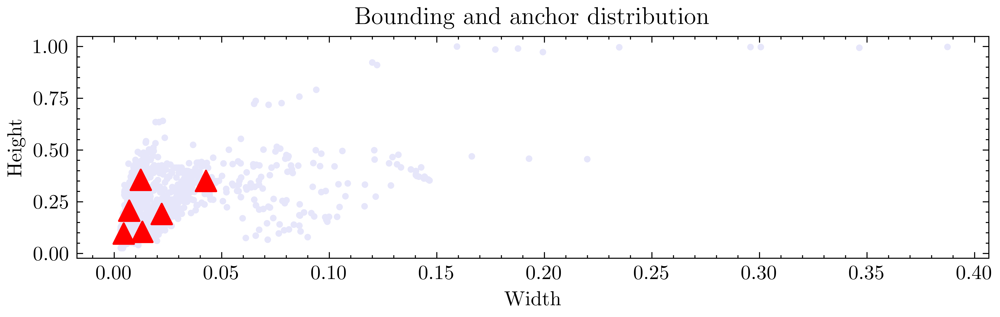

Recommanded aspect ratios(width/height)
Width    Height   Height/Width
4.510      12.340     21.9
13.410      13.430     8.0
7.130      26.525     29.8
22.625      24.470     8.7
12.650      45.570     28.8
43.660      44.910     8.2


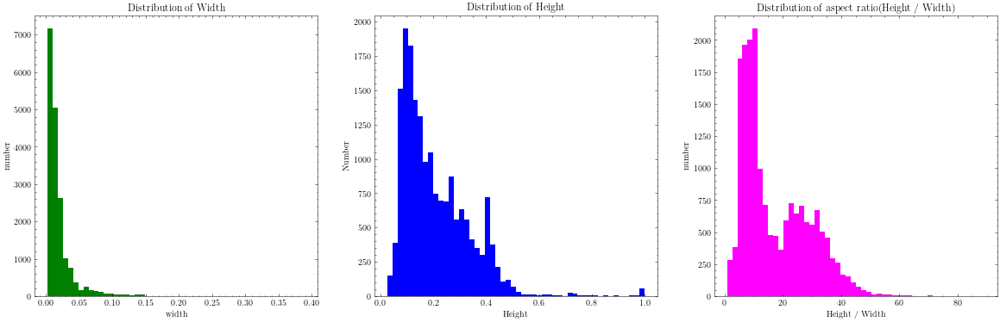

In [45]:
out_sorted = sort_cluster(out)
print("Accuracy: {:.2f}%".format(avg_iou(wh, out) * 100))

show_cluster(wh, out, max_points=2000)

if out.dtype != np.float32:
	out = out.astype(np.float32)

print("Recommanded aspect ratios(width/height)")
print("Width    Height   Height/Width")
for i in range(len(out_sorted)):
	print("%.3f      %.3f     %.1f" % (out_sorted[i,0]*IMG_W, out_sorted[i,1]*IMG_H, out_sorted[i,2]))
show_width_height(wh, out, bins=50)

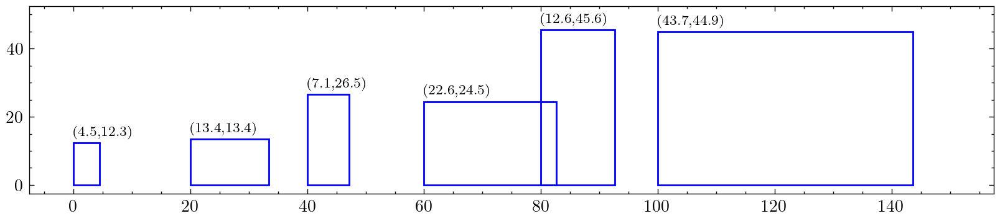

In [106]:
from matplotlib.patches import Rectangle

#define Matplotlib figure and axis
fig, ax = plt.subplots(figsize=(10, 2), dpi=200)

#create simple line plot

#add rectangle to plot

positions = [[xpos, 0] for xpos in [0, 20, 40, 60, 80, 100]]

for pos, twidth, theight in zip(positions, out_sorted[:,0], out_sorted[:,1]):
    _width = twidth * IMG_W
    _height = theight * IMG_H
    ax.add_patch(Rectangle(pos, _width, _height, fill=False, color='blue'))
    ax.annotate(f"({round(_width, 1)},{round(_height, 1)})", (pos[0], pos[1]+_height+2), color='black', weight='bold', fontsize=8)

ax.plot([0, 150],[0, 50], linewidth=0)

#display plot
plt.show()

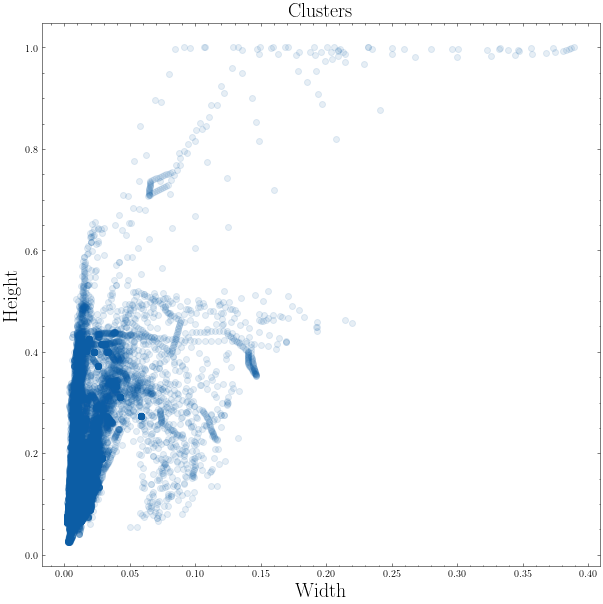

In [40]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.scatter(wh[:,0],wh[:,1],alpha=0.1)
plt.title("Clusters",fontsize=20)
plt.xlabel("Width",fontsize=20)
plt.ylabel("Height",fontsize=20)
plt.show()

In [162]:
import sys
import os
import numpy as np
import xml.etree.ElementTree as ET

from sklearn.cluster import KMeans

def load_boxes(_annotations, rescale_width=None, rescale_height=None):
  """Extracts bounding-box widths and heights from ground-truth dataset.

  Args:
  path : Path to .xml annotation files for your dataset.
  rescale_width : Scaling factor to rescale width of bounding box.
  rescale_height : Scaling factor to rescale height of bounding box.

  Returns:
  bboxes : A numpy array with pairs of box dimensions as [width, height].
  """
  res = []

  for row in _annotations.itertuples():
      bbox_width = row.width
      bbox_height = row.height
      if rescale_width and rescale_height:
        bbox_width = bbox_width/rescale_width
        bbox_height = bbox_height/rescale_height

      if bbox_width <= 0 or bbox_height <= 0:
        print("Invalid bounding box with width and height <= 0: {}".format(row))
      res.append([bbox_width, bbox_height])
  bboxes = np.array(res)
  return bboxes


def average_iou(bboxes, anchors):
    """Calculates the Intersection over Union (IoU) between bounding boxes and
    anchors.

    Args:
    bboxes : Array of bounding boxes in [width, height] format.
    anchors : Array of aspect ratios [n, 2] format.

    Returns:
    avg_iou_perc : A Float value, average of IOU scores from each aspect ratio
    """
    intersection_width = np.minimum(anchors[:, [0]], bboxes[:, 0]).T
    intersection_height = np.minimum(anchors[:, [1]], bboxes[:, 1]).T

    if np.any(intersection_width == 0) or np.any(intersection_height == 0):
        raise ValueError("Some boxes have zero size.")

    intersection_area = intersection_width * intersection_height
    boxes_area = np.prod(bboxes, axis=1, keepdims=True)
    anchors_area = np.prod(anchors, axis=1, keepdims=True).T
    union_area = boxes_area + anchors_area - intersection_area
    avg_iou_perc = np.mean(np.max(intersection_area / union_area, axis=1)) * 100

    return avg_iou_perc

def kmeans_aspect_ratios(bboxes, kmeans_max_iter, num_aspect_ratios):
  """Calculate the centroid of bounding boxes clusters using Kmeans algorithm.

  Args:
  bboxes : Array of bounding boxes in [width, height] format.
  kmeans_max_iter : Maximum number of iterations to find centroids.
  num_aspect_ratios : Number of centroids to optimize kmeans.

  Returns:
  aspect_ratios : Centroids of cluster (optmised for dataset).
  avg_iou_prec : Average score of bboxes intersecting with new aspect ratios.
  """

  assert len(bboxes), "You must provide bounding boxes"

  normalized_bboxes = bboxes / np.sqrt(bboxes.prod(axis=1, keepdims=True))

  # Using kmeans to find centroids of the width/height clusters
  kmeans = KMeans(
      init='random', n_clusters=num_aspect_ratios, random_state=0, max_iter=kmeans_max_iter)
  kmeans.fit(X=normalized_bboxes)
  ar = kmeans.cluster_centers_

  assert len(ar), "Unable to find k-means centroid, try increasing kmeans_max_iter."

  avg_iou_perc = average_iou(normalized_bboxes, ar)

  if not np.isfinite(avg_iou_perc):
    sys.exit("Failed to get aspect ratios due to numerical errors in k-means")

  aspect_ratios = [w/h for w,h in ar]

  return aspect_ratios, avg_iou_perc, ar

def _calculate_aspect(width: int, height: int) -> str:
    width, height = int(width), int(height)

    def gcd(a, b):
        """highest number that evenly divides both width and height."""
        return a if b == 0 else gcd(b, a % b)

    r = gcd(width, height)
    x = int(width / r)
    y = int(height / r)

    return f"{x}:{y}"

In [163]:
annotations.head()

,id,image_id,category_id,area,xmin,ymin,xmax,ymax,width,height
0,1,1,1,280.2960,725.93,63.64,746.33,77.38,20.40,13.74
1,2,1,7,248.6808,351.26,81.08,359.20,112.40,7.94,31.32
2,3,1,6,171.6447,187.57,81.25,194.84,104.86,7.27,23.61
3,4,1,6,144.4352,431.30,87.54,438.58,107.38,7.28,19.84
4,5,1,1,1454.7000,107.80,78.10,145.10,117.10,37.30,39.00


In [164]:
# Tune this based on your accuracy/speed goals as described above
num_aspect_ratios = 6 # can be [2,3,4,5,6]

# Tune the iterations based on the size and distribution of your dataset
# You can check avg_iou_prec every 100 iterations to see how centroids converge
kmeans_max_iter = 500

# These should match the training pipeline config ('fixed_shape_resizer' param)
width = 1024
height = 128

# Get the ground-truth bounding boxes for our dataset
bboxes = load_boxes(annotations, rescale_width=width, rescale_height=height)

aspect_ratios, avg_iou_perc, AR =  kmeans_aspect_ratios(
                                      bboxes=bboxes,
                                      kmeans_max_iter=kmeans_max_iter,
                                      num_aspect_ratios=num_aspect_ratios)

aspect_ratios = sorted(aspect_ratios)

print('Aspect ratios generated:', [round(ar, 2) for ar in aspect_ratios])
print('Average IOU with anchors:', avg_iou_perc)

# Ratio

Aspect ratios generated: [0.02, 0.03, 0.04, 0.06, 0.1, 0.19]
Average IOU with anchors: 89.09284912935405


In [165]:
# aspect_ratios = [w/h for w,h in ar]
print([_calculate_aspect(w, h) for w, h in AR])

['0:1', '0:1', '0:1', '0:1', '0:1', '0:1']


## Evaluation of BasicModel

In [1]:
from tools import analytics

In [2]:
def pprint(lst):
    for l in lst:
        print(l)

In [3]:
scalarfile = "outputs/configs/tdt4265/logs/scalars.json"
names = []
mapframe = analytics.convert_scalar_to_metrics_map(scalarfile)
lossframe = analytics.convert_scalar_to_metrics_loss(scalarfile)

pprint(mapframe.columns.tolist())
pprint(lossframe.columns.tolist())

metrics/mAP
metrics/mAP@0.5
metrics/mAP@0.75
metrics/mAP_small
metrics/mAP_medium
metrics/mAP_large
metrics/average_recall@1
metrics/average_recall@10
metrics/average_recall@100
metrics/average_recall@100_small
metrics/average_recall@100_medium
metrics/average_recall@100_large
metrics/AP_car
metrics/AP_bus
metrics/AP_person
metrics/AP_rider
global_step
loss/regression_loss
loss/classification_loss
loss/total_loss
global_step


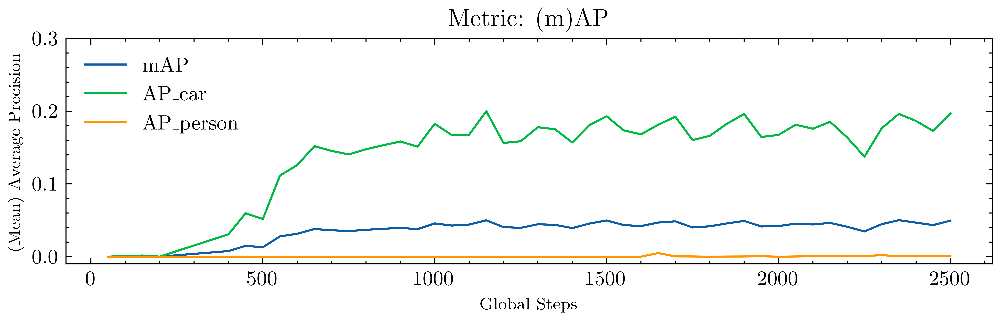

In [4]:
axis_cfg = {"x": None, "y": (-0.01, 0.3)}
metric_to_show = ["metrics/mAP", "metrics/AP_car", "metrics/AP_person"]
analytics.vizualize_metrics(mapframe, metric_to_show, axis_cfg)

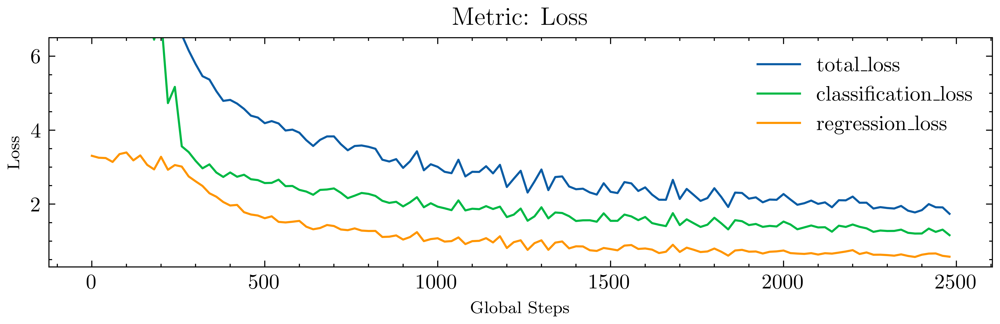

In [5]:
axis_cfg = {"x": None, "y": (0.3, 6.5)}
metric_to_show = ["loss/total_loss", "loss/classification_loss", "loss/regression_loss"]
analytics.vizualize_loss(lossframe, metric_to_show, axis_cfg)

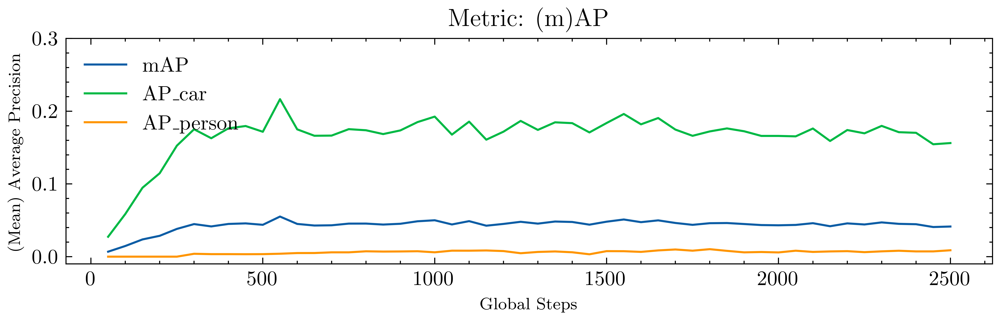

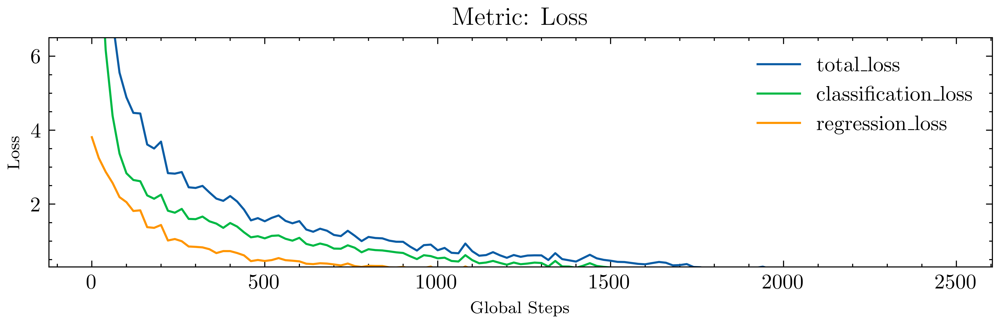

In [6]:
scalarfile = "outputs/configs/resnet/logs/scalars.json"

mapframe = analytics.convert_scalar_to_metrics_map(scalarfile)
lossframe = analytics.convert_scalar_to_metrics_loss(scalarfile)

axis_cfg = {"x": None, "y": (-0.01, 0.3)}
metric_to_show = ["metrics/mAP", "metrics/AP_car", "metrics/AP_person"]
analytics.vizualize_metrics(mapframe, metric_to_show, axis_cfg)

axis_cfg = {"x": None, "y": (0.3, 6.5)}
metric_to_show = ["loss/total_loss", "loss/classification_loss", "loss/regression_loss"]
analytics.vizualize_loss(lossframe, metric_to_show, axis_cfg)

# Task 2.2

In [7]:
"""

I1 = RandomHorizontalFlip
I2 = RandomSampleCrop
I3 = ColorJitter
I4 = RandomAdjustSharpness

"""

'\n\nI1 = RandomHorizontalFlip\nI2 = RandomSampleCrop\nI3 = ColorJitter\nI4 = RandomAdjustSharpness\n\n'

In [8]:
from tools import analytics

scalarfiles = [
    "outputs/configs/task22/baseline/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline2/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline3/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline4/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline5/logs/scalars.json", # baseline
]
names = ["baseline", "baseline + I1", "baseline + I2", "baseline + I3", "baseline + I4"]
mapframes = [analytics.convert_scalar_to_metrics_map(scalarfile) for scalarfile in scalarfiles]
lossframe = [analytics.convert_scalar_to_metrics_loss(scalarfile) for scalarfile in scalarfiles]

# mapframe = analytics.convert_scalar_to_metrics_map(scalarfile)
# lossframe = analytics.convert_scalar_to_metrics_loss(scalarfile)

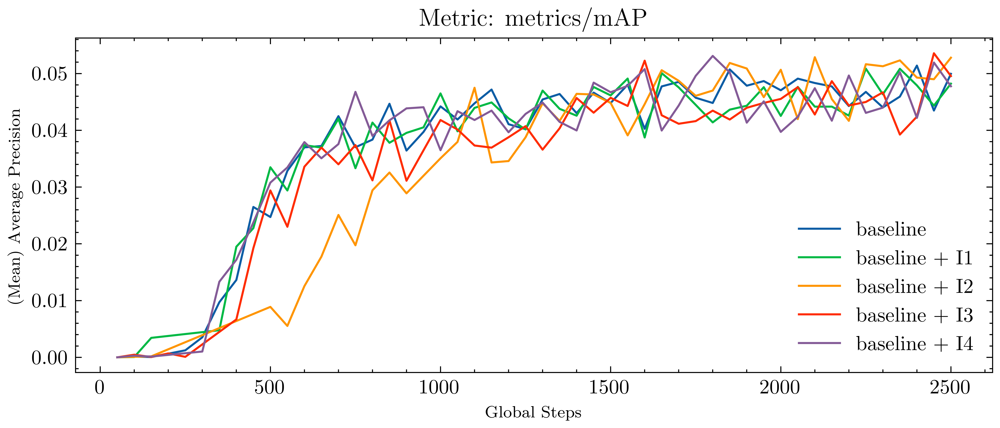

In [9]:
analytics.multi_vizualize_metric(names, mapframes, "metrics/mAP", axis_cfg={"x": None, "y": None})

In [10]:
scalarfiles = [
    "outputs/configs/task22/baseline/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline23/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline24/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline25/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline34/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline35/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline45/logs/scalars.json", # baseline
    "outputs/configs/task22/baseline50X/logs/scalars.json", # baseline
]

names = ["baseline",
        "baseline + I1 + I2",
        "baseline + I1 + I3",
        "baseline + I1 + I4",
        "baseline + I2 + I3",
        "baseline + I2 + I4",
        "baseline + I3 + I4",
        "baseline + I1+I2+I3+I4",
]

mapframes = [analytics.convert_scalar_to_metrics_map(scalarfile) for scalarfile in scalarfiles]
lossframe = [analytics.convert_scalar_to_metrics_loss(scalarfile) for scalarfile in scalarfiles]

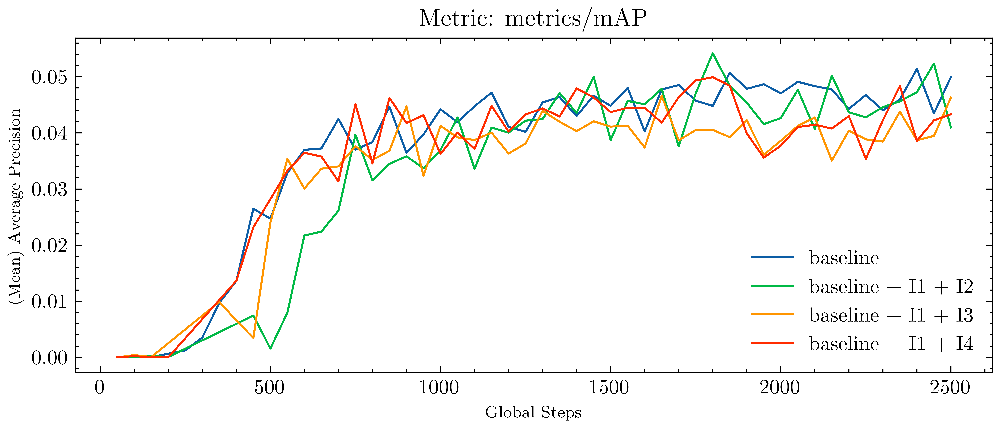

In [11]:
analytics.multi_vizualize_metric(names[0:4], mapframes[0:4], "metrics/mAP", axis_cfg={"x": None, "y": None})

# analytics.multi_vizualize_metric(names, mapframes, "metrics/mAP", axis_cfg={"x": None, "y": None})

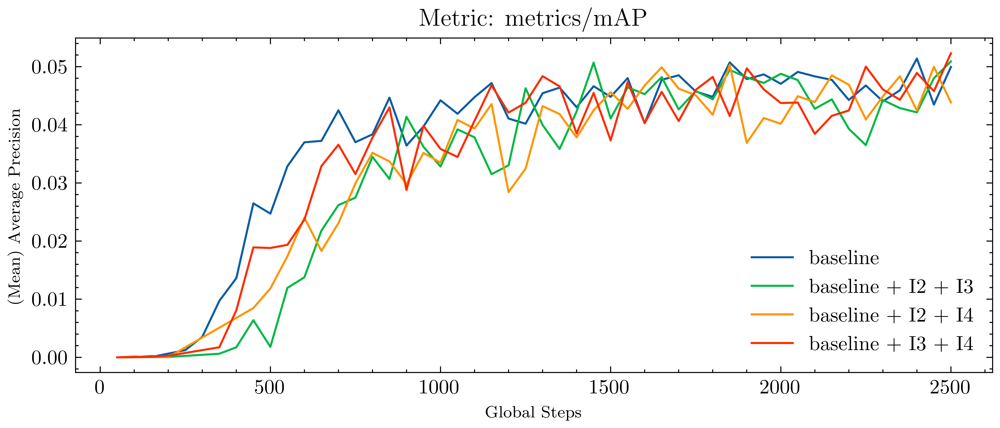

In [12]:
analytics.multi_vizualize_metric([names[0]]+names[4:-1], [mapframes[0]]+mapframes[4:-1], "metrics/mAP", axis_cfg={"x": None, "y": None})

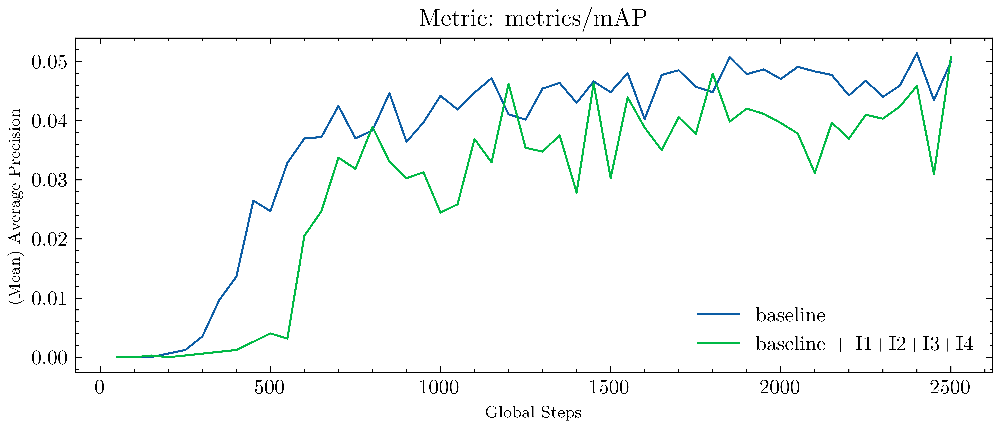

In [13]:
analytics.multi_vizualize_metric([names[0]]+[names[-1]], [mapframes[0]]+[mapframes[-1]], "metrics/mAP", axis_cfg={"x": None, "y": None})

# Task 2.3

In [6]:
from tools import analytics

scalarfiles = [
    "outputs/configs/task22/baseline_aug1234/logs/scalars.json", 
    "outputs/configs/task23/retina_P1/logs/scalars.json", 
    "outputs/configs/task23/retina_P2/logs/scalars.json", 
    "outputs/configs/task23/retina_P3/logs/scalars.json", 
    "outputs/configs/task23/retina_P4/logs/scalars.json", 
    "outputs/configs/task23/retina_P5/logs/scalars.json", 
]

names = ["*Baseline", "Exp 1", "Exp 2", "Exp 3", "Exp 4", "*Exp 4"]
mapframes = [analytics.convert_scalar_to_metrics_map(scalarfile) for scalarfile in scalarfiles]
lossframe = [analytics.convert_scalar_to_metrics_loss(scalarfile) for scalarfile in scalarfiles]

# mapframe = analytics.convert_scalar_to_metrics_map(scalarfile)
# lossframe = analytics.convert_scalar_to_metrics_loss(scalarfile)

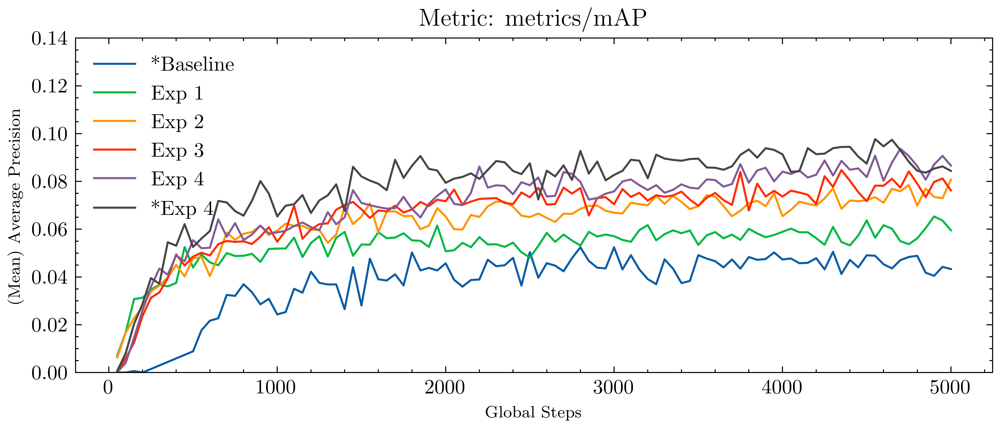

In [14]:
analytics.multi_vizualize_metric(names, mapframes, "metrics/mAP", axis_cfg={"x": None, "y": (0, 0.14), "figsize": None})

In [8]:

loss_scalers = [analytics.convert_scalar_to_metrics_loss(scalarfile) for scalarfile in scalarfiles]

analytics.multi_vizualize_loss(names, loss_scalers, axis_cfg={"x": None, "y": (0, 3)})

/home/andy/dev/neuralvision/tools/analytics.py:354: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


# Task 2.5

In [1]:
from tools import analytics

scalarfiles = [
    "outputs/configs/retina_P4/logs/scalars.json", 
    "outputs/configs/task25/retina_P4_retrain/logs/scalars.json", 
]

names = ["Exp 4A", "Exp 4B"]
mapframes = [analytics.convert_scalar_to_metrics_map(scalarfile) for scalarfile in scalarfiles]
lossframe = [analytics.convert_scalar_to_metrics_loss(scalarfile) for scalarfile in scalarfiles]

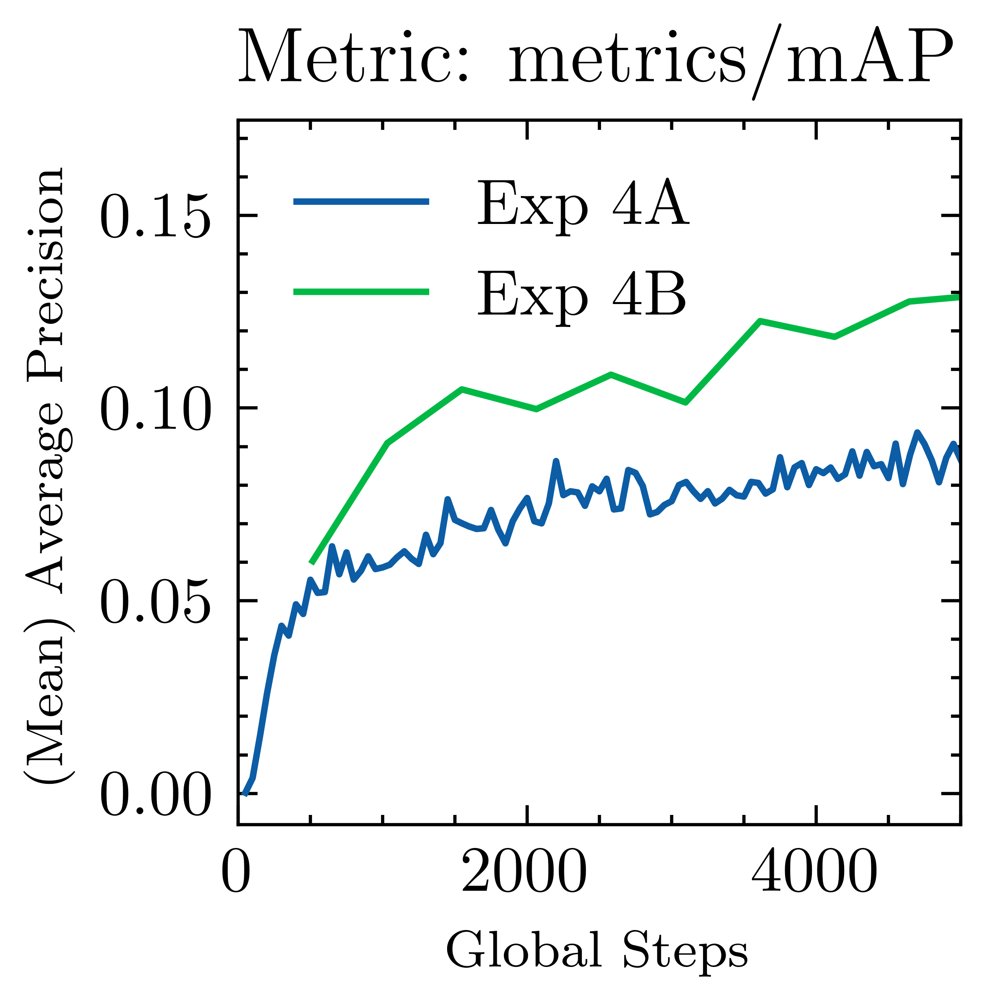

In [5]:
analytics.multi_vizualize_metric(names, mapframes, "metrics/mAP", axis_cfg={"x": (0, 5000), "y": None, "figsize": (2, 2)})

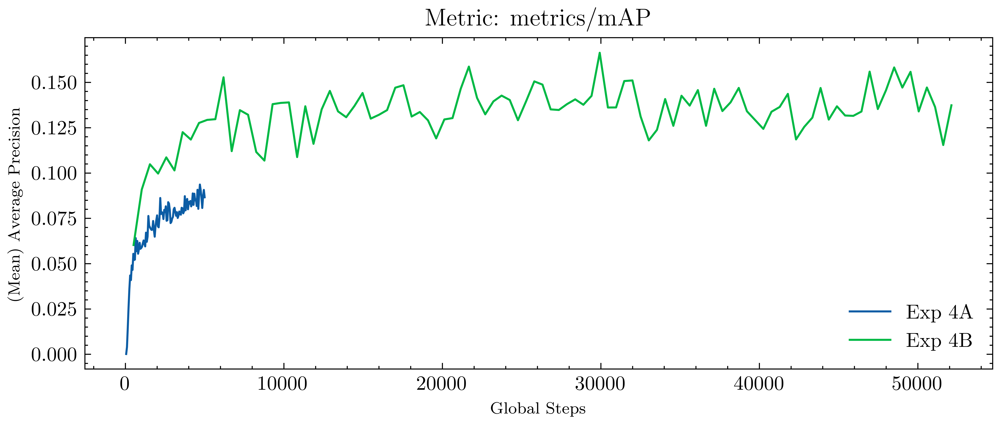

In [17]:
analytics.multi_vizualize_metric(names, mapframes, "metrics/mAP", axis_cfg={"x": None, "y": None})


In [18]:
analytics.multi_vizualize_loss(names, lossframe, axis_cfg={"x": None, "y": (0, 1)})


/home/andy/dev/neuralvision/tools/analytics.py:341: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
